In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

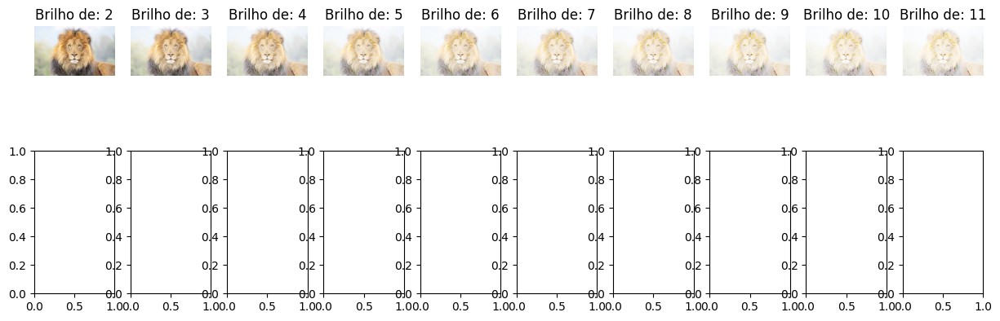

In [6]:
# Lista dos brilho

img = cv.imread('storage/leao.jpg').astype(np.float32) / 255
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)


brilho_li = [x for x in range(2, 12)]

# Crie uma figura com subplots
fig, axs = plt.subplots(2, len(brilho_li), figsize=(15, 5))

# Itere sobre os brilho
for i, brilho in enumerate(brilho_li):

    gamma = 1/brilho
    result = np.power(img, gamma)

    # Exiba a imagem no subplot correspondente
    axs[0,i].imshow(result)
    axs[0,i].set_title(f'Brilho de: {brilho}')
    axs[0,i].axis('off')

    gamma = 1/brilho
    result = np.power(img, gamma)

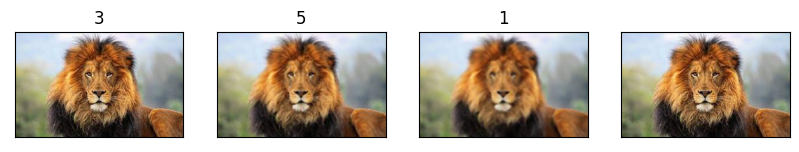

In [7]:
a = 1

plt.figure(figsize=(10,10))

for i in range(1,8,2):
    if i == 7: i = 1
    else: i
    result = cv.medianBlur(img,i)
    subplot = '14' + str(a)
    
    plt.title(i)
    plt.subplot(int(subplot)), plt.imshow(result)
    plt.xticks([]), plt.yticks([])

    a +=1
    


In [8]:
gauss_img = cv.GaussianBlur(img, (5,5),10)
median_img = cv.medianBlur(img,5)
simple_img = cv.blur(img, ksize=(5,5))

kernel = np.ones(shape=(7,7), dtype=np.float32)/49
kernel_img = cv.filter2D(img, -1, kernel)

(Text(0.5, 1.0, 'KERNEL'), ([], []), ([], []))

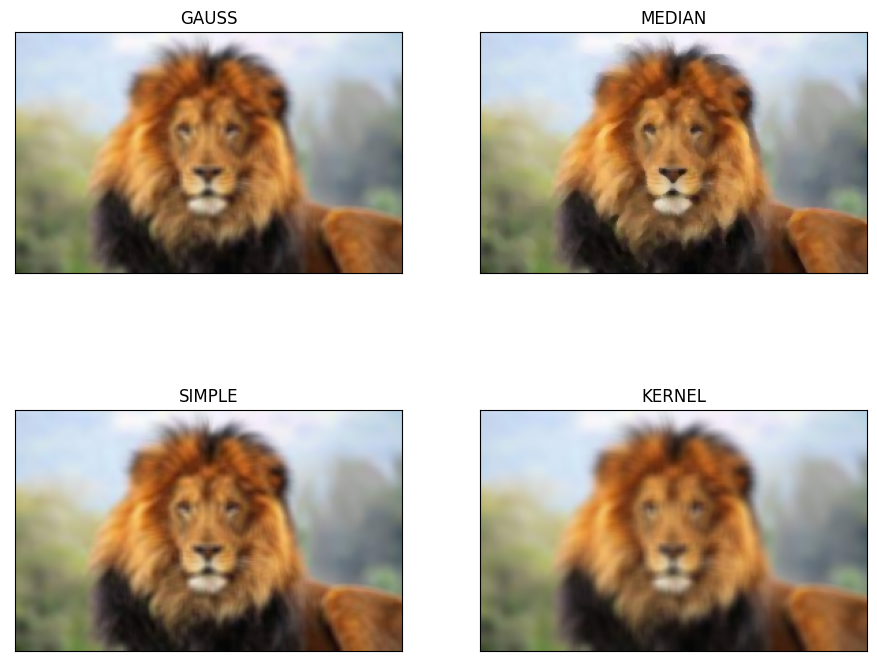

In [9]:
plt.figure(figsize=(11,9))

plt.subplot(221), plt.imshow(gauss_img)
plt.title('GAUSS'), plt.xticks([]),plt.yticks([])

plt.subplot(222), plt.imshow(median_img)
plt.title('MEDIAN'), plt.xticks([]),plt.yticks([])

plt.subplot(223), plt.imshow(simple_img)
plt.title('SIMPLE'), plt.xticks([]),plt.yticks([])

plt.subplot(224), plt.imshow(kernel_img)
plt.title('KERNEL'), plt.xticks([]),plt.yticks([])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


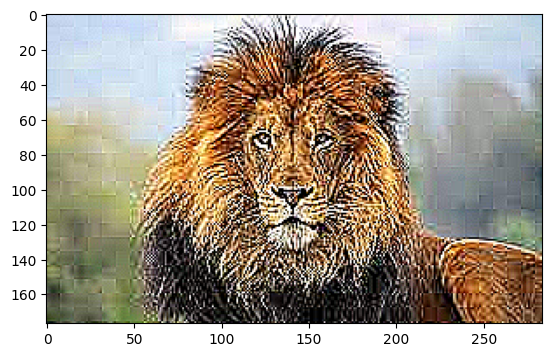

In [11]:
#3
k = np.array([[0, -2, 0],
             [-2, 9, -2],
             [0, -2, 0]])


sharp_img = cv.filter2D(src=img, ddepth=-1, kernel=k)
plt.imshow(sharp_img);

(Text(0.5, 1.0, 'Arestas da Imagem - Eixo XY'), ([], []), ([], []))

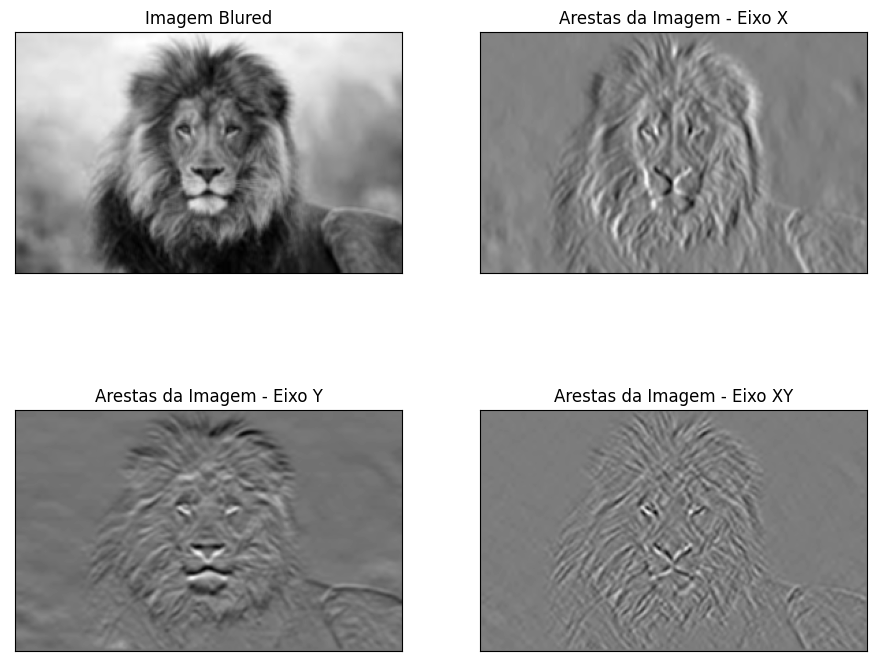

In [12]:
#4)
img = img[:,:,1]

gauss_img = cv.GaussianBlur(img, (3,3),10)

sobelx = cv.Sobel(src=gauss_img, ddepth=cv.CV_64F,dx=1, dy=0, ksize=5)
sobely = cv.Sobel(src=gauss_img, ddepth=cv.CV_64F,dx=0, dy=1, ksize=5)
sobelxy = cv.Sobel(src=gauss_img, ddepth=cv.CV_64F,dx=1, dy=1, ksize=5)

plt.figure(figsize=(11,9))

plt.subplot(221), plt.imshow(gauss_img,cmap='gray')
plt.title('Imagem Blured'), plt.xticks([]),plt.yticks([])

plt.subplot(222), plt.imshow(sobelx,cmap='gray')
plt.title('Arestas da Imagem - Eixo X'), plt.xticks([]),plt.yticks([])

plt.subplot(223), plt.imshow(sobely,cmap='gray')
plt.title('Arestas da Imagem - Eixo Y'), plt.xticks([]),plt.yticks([])

plt.subplot(224), plt.imshow(sobelxy,cmap='gray')
plt.title('Arestas da Imagem - Eixo XY'), plt.xticks([]),plt.yticks([])

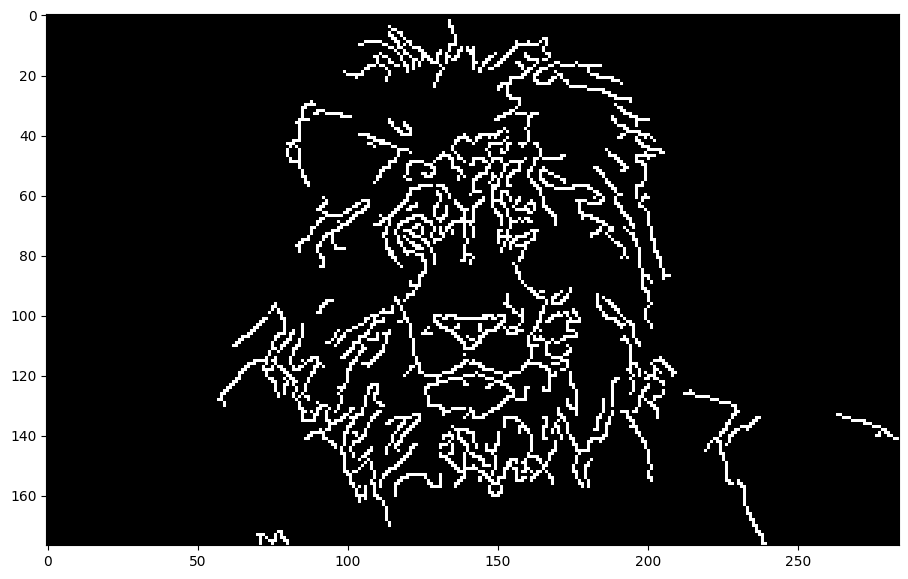

In [13]:
img = cv.imread('storage/leao.jpg', 0)

median_img = cv.medianBlur(img,3)
edges = cv.Canny(median_img,100,250)

plt.figure(figsize=(11,9))
plt.imshow(edges, cmap='gray')

Text(0.5, 1.0, 'Histograma de Cores')

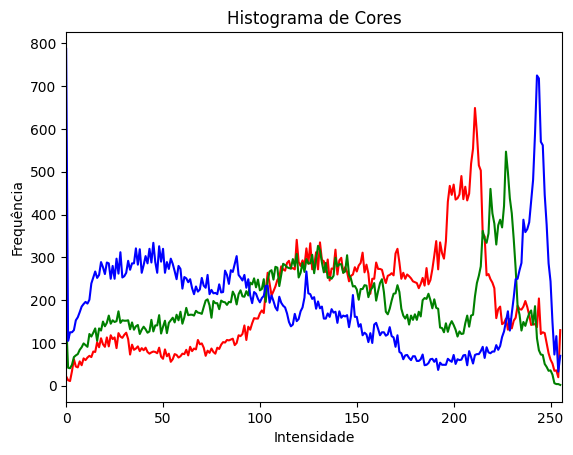

In [15]:
#5)
img = cv.imread('storage/leao.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

color = ('r', 'g', 'b')

for i, col in enumerate(color):
    hist = cv.calcHist([img], channels=[i], mask=None, histSize=[256], ranges=[0,256])
    plt.plot(hist, color=col)
    plt.xlim([0,256])

plt.xlabel('Intensidade')
plt.ylabel('Frequência')
plt.title('Histograma de Cores')

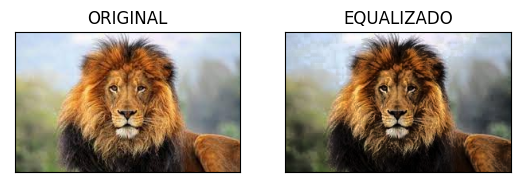

In [17]:
#6
img = cv.imread('storage/leao.jpg')
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
hsv[:,:,2] = cv.equalizeHist(hsv[:,:,2])
eq_color_img = cv.cvtColor(hsv, cv.COLOR_HSV2RGB)
#plt.imshow(eq_color_img)


img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.subplot(221), plt.imshow(img)
plt.title('ORIGINAL'), plt.xticks([]),plt.yticks([])

plt.subplot(222), plt.imshow(eq_color_img)
plt.title('EQUALIZADO'), plt.xticks([]),plt.yticks([])

plt.imshow(eq_color_img)

# Voltando ao SOM

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from IPython.display import Audio

In [21]:
def make_sound_wave(A0, f0, t_total, sr, kind="sin"):
    
    t = np.linspace(0, t_total, int(sr*t_total))
    
    if kind == "sin":
        wav = A0 * np.sin(2 * np.pi * f0 * t) 
    
    elif kind == "cos":
        wav = A0 * np.cos(2 * np.pi * f0 * t) 
    
    else:
        raise ValueError("Únicas opções são 'sin' ou 'cos'!")
    
    return t, wav

In [20]:
def plot_sound_wave(t, wav, freq=None, n_samples_to_plot=200, title=None, figsize=(16, 5)):
    
    fig, ax = plt.subplots(figsize=figsize)

    plt.title(title)

    # pro caso de mais de um áudio!
    if isinstance(wav, list):
        
        # sobretudo importante pro caso de "freq" ser None
        if isinstance(freq, list):
            for w, f in zip(wav, freq):
                plt.plot(t, w, label=f"Sinal de f={f}Hz")
        else:
            for i, w in enumerate(wav):
                plt.plot(t, w, label=f"Sinal de áudio {i+1}")
    
    else:
        if freq:
            plt.plot(t, wav, label=f"Sinal de f={freq}Hz")
        
        # pro caso de "freq" ser None
        else:
            plt.plot(t, wav, label=f"Sinal de áudio")

    plt.xlabel("Tempo")
    plt.ylabel("Amplitude")

    plt.xlim(0, t[n_samples_to_plot])
    
    A_max = np.abs(wav).max()
    plt.ylim(-A_max*1.1, A_max*1.1)
    
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

In [22]:
sr = 44000

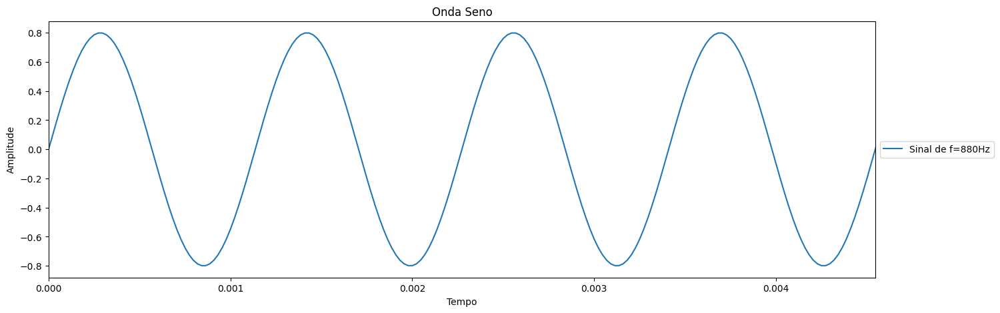

In [23]:
t_sin, wave_sin = make_sound_wave(A0=0.8, f0=880, t_total=2, sr=sr, kind='sin')

plot_sound_wave(t_sin, wave_sin, freq=880, n_samples_to_plot=200, title='Onda Seno', figsize=(16,5))

Audio(wave_sin, rate=sr)

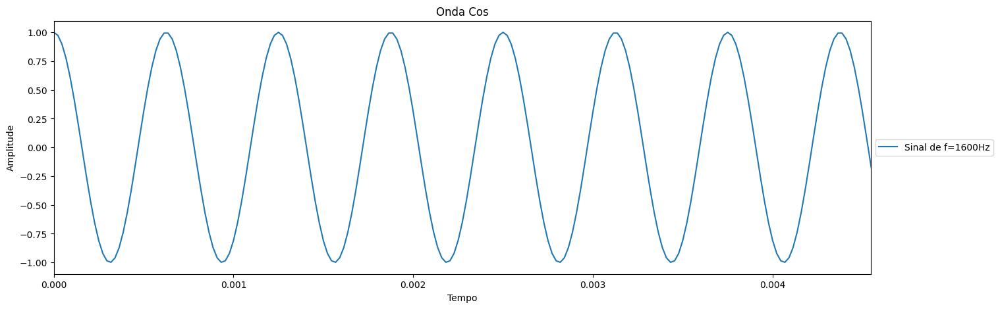

In [24]:
t_cos, wave_cos = make_sound_wave(A0=1, f0=1600, t_total=2, sr=sr, kind='cos')

plot_sound_wave(t_cos, wave_cos, freq=1600, n_samples_to_plot=200, title='Onda Cos', figsize=(16,5))

Audio(wave_cos, rate=sr)

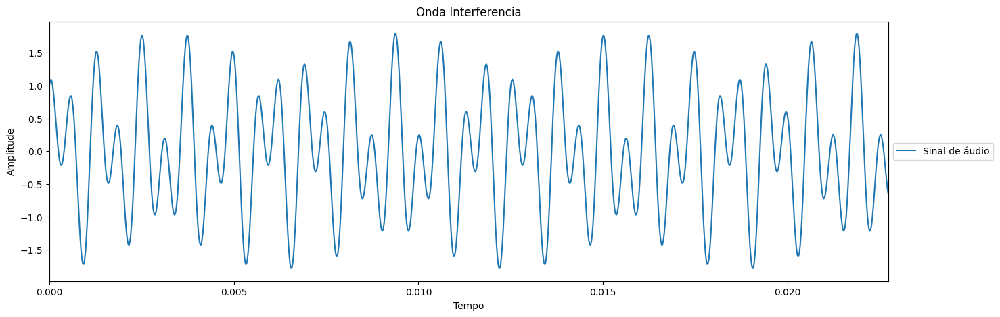

In [25]:
wave_interf = wave_sin + wave_cos

plot_sound_wave(t_cos, wave_interf, freq=None, n_samples_to_plot=1000, title='Onda Interferencia', figsize=(16,5))

Audio(wave_interf, rate=sr)

In [26]:
wave_sin_fft = np.fft.fft(wave_sin)

In [27]:
wave_sin_fft

array([1.09421361e-11+0.j        , 1.62140629e-08-0.00045394j,
       6.48228853e-08-0.00090789j, ..., 1.45853265e-07+0.00136183j,
       6.48228849e-08+0.00090789j, 1.62140619e-08+0.00045394j])

In [28]:
wave_sin.shape[0]

88000

In [29]:
wave_sin_fft_freq = np.fft.fftfreq(n=wave_sin.shape[0], d=1/sr)

In [30]:
wave_sin_fft_freq.shape

(88000,)

In [31]:
wave_sin_fft_freq

array([ 0. ,  0.5,  1. , ..., -1.5, -1. , -0.5])

In [32]:
abs(wave_sin_fft)

array([1.09421361e-11, 4.53942112e-04, 9.07885111e-04, ...,
       1.36182987e-03, 9.07885111e-04, 4.53942112e-04])

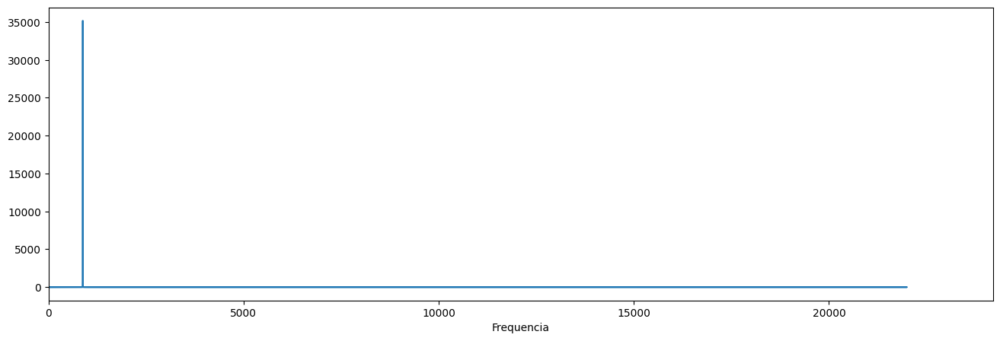

In [37]:
f, ax = plt.subplots(figsize=(16,5))

plt.plot(wave_sin_fft_freq, abs(wave_sin_fft))
plt.xlabel("Frequencia")
plt.xlim(0)
plt.show()

In [38]:
import pandas as pd

In [45]:
dados_fft = {'freq': wave_sin_fft_freq,
            "amplitude": abs(wave_sin_fft)}

dados_fft = pd.DataFrame(dados_fft).query("freq > 0")

In [46]:
dados_fft

,freq,amplitude
1,0.5,0.000454
2,1.0,0.000908
3,1.5,0.001362
4,2.0,0.001816
5,2.5,0.002270
...,...,...
43995,21997.5,0.050332
43996,21998.0,0.050332
43997,21998.5,0.050332
43998,21999.0,0.050332


In [47]:
dados_fft.query("875 < freq < 885")

,freq,amplitude
1750,875.0,70.013094
1751,875.5,77.797414
1752,876.0,87.522946
1753,876.5,100.019270
1754,877.0,116.667177
1755,877.5,139.947693
1756,878.0,174.810527
1757,878.5,232.761291
1758,879.0,348.088987
1759,879.5,689.549258


In [44]:
from scipy.signal import find_peaks

In [48]:
indice_do_pico = find_peaks(dados_fft["amplitude"])[0]

In [49]:
indice_do_pico

array([1759], dtype=int64)

In [51]:
dados_fft["freq"][indice_do_pico+1]

1760    880.0
Name: freq, dtype: float64

In [58]:
def find_peak_freqs_fft(wave_fft, wave_fft_freq):
    df_wave_fft = pd.DataFrame({'freq': wave_fft_freq,
                               'amplitude': np.abs(wave_fft)}).query('freq > 0')
    indices_dos_picos = find_peaks(df_wave_fft['amplitude'])[0]
    
    peaks = (df_wave_fft.iloc[indices_dos_picos].sort_values("amplitude", ascending=False).values)
    
    return peaks

In [59]:
peaks = find_peak_freqs_fft(wave_sin_fft, wave_sin_fft_freq)

0 [  880.         35176.64297689]


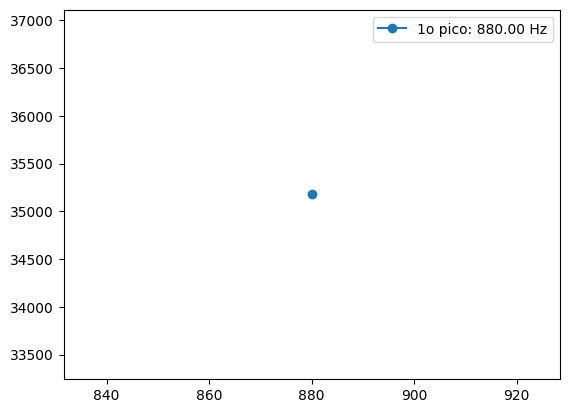

In [60]:
for i, peak in enumerate(peaks):
    print(i, peak)
    
    plt.plot(*peak, marker="o", label=f"{i+1}o pico: {peak[0]:.2f} Hz")
    
    plt.legend()

In [67]:
def calc_plot_fft(wave, sr, x_lim=(0, 1000), find_peaks=True):
    
    sr = 44000
    wave_fft = np.fft.fft(wave)
    wave_fft_freq = np.fft.fftfreq(n=wave.size, d=1/sr)
    
    if find_peaks:
        peaks = find_peak_freqs_fft(wave_fft, wave_fft_freq)
        
    f, ax = plt.subplots(figsize=(16,5))
    
    plt.plot(wave_fft_freq, abs(wave_fft), label = 'FFT')
    
    if find_peaks:
        for i, peak in enumerate(peaks):
            plt.plot(*peak, marker="o", label=f"{i+1}o pico: {peak[0]:.1f} Hz")
            
    
    plt.xlabel("Frequencia")
    plt.xlabel("Amplitude")
    
    plt.xlim(x_lim)
    
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    plt.show()

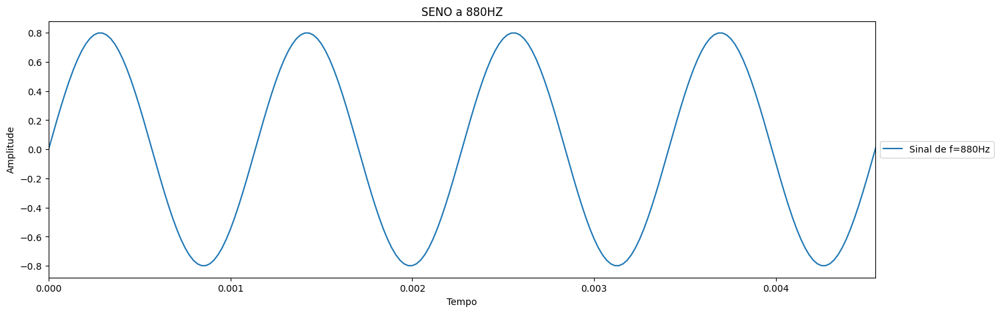

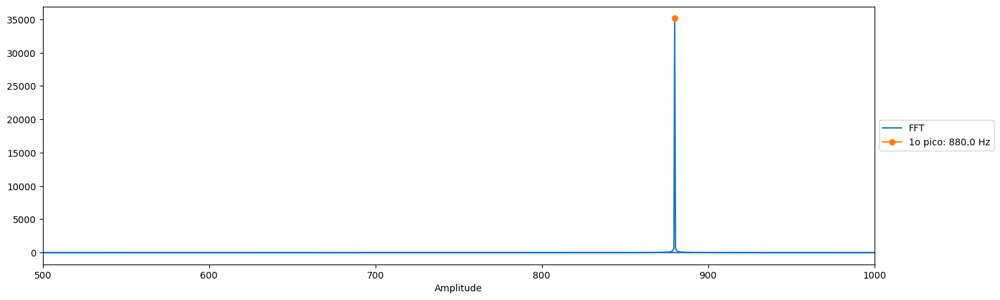

In [68]:
t_sin, wave_sin = make_sound_wave(A0=0.8, f0=880, t_total=2, sr=sr, kind='sin')

plot_sound_wave(t_sin, wave_sin, freq=880, n_samples_to_plot=200, title="SENO a 880HZ", figsize=(16,5))

calc_plot_fft(wave_sin, sr, x_lim=(500,1000), find_peaks=True)



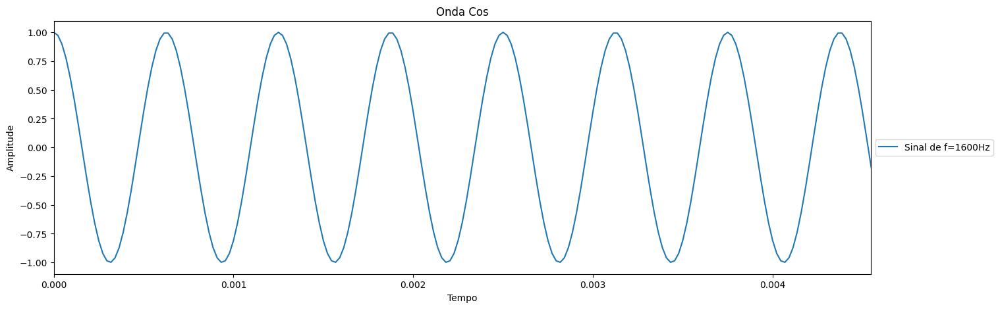

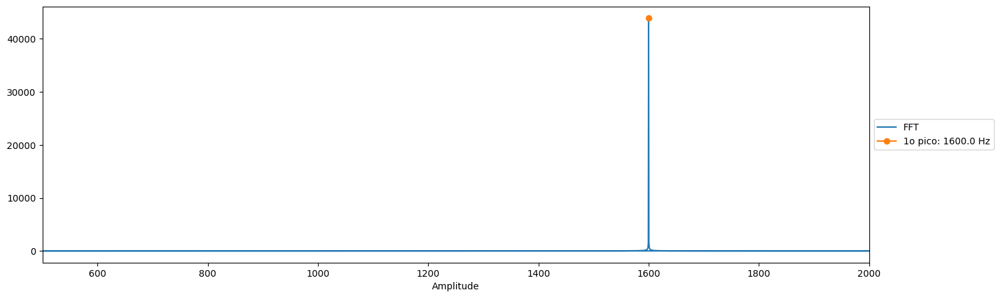

In [69]:
t_cos, wave_cos = make_sound_wave(A0=1, f0=1600, t_total=2, sr=sr, kind='cos')

plot_sound_wave(t_cos, wave_cos, freq=1600, n_samples_to_plot=200, title='Onda Cos', figsize=(16,5))
calc_plot_fft(wave_cos, sr, x_lim=(500,2000), find_peaks=True)


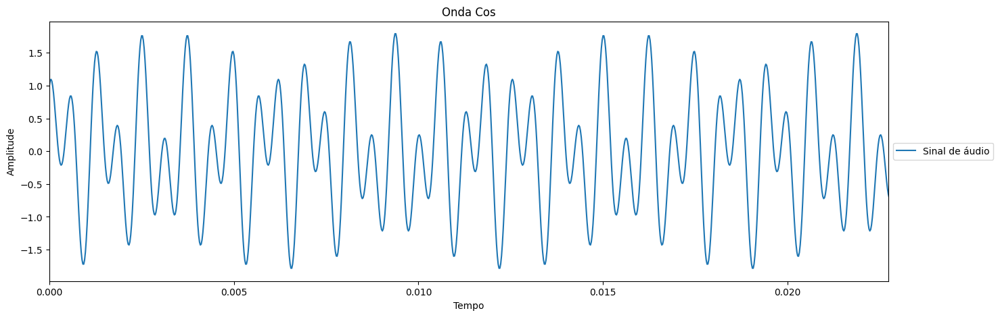

In [71]:
wave_interf = wave_sin + wave_cos
plot_sound_wave(t_cos, wave_interf, freq=None, n_samples_to_plot=1000, title='Onda Cos', figsize=(16,5))

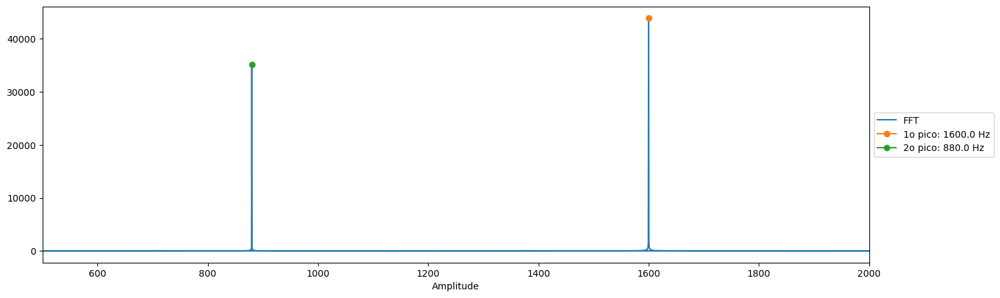

In [72]:
calc_plot_fft(wave_interf, sr, x_lim=(500,2000), find_peaks=True)

# Espectograma

In [73]:
import librosa
import librosa.display
#!pip install librosa

import mir_eval
#!pip install mir_eval

In [74]:
librosa.util.list_examples()

AVAILABLE EXAMPLES
--------------------------------------------------------------------
brahms    	Brahms - Hungarian Dance #5
choice    	Admiral Bob - Choice (drum+bass)
fishin    	Karissa Hobbs - Let's Go Fishin'
humpback  	Glacier Bay 60-second clip humpback whale song November 2020
libri1    	Ashiel Mystery - A Detective Story, chapter 2, narrated by Garth Comira
libri2    	The Age of Chivalry / Chapter 18: Perceval / Read by Anders Lankford
libri3    	Sense and Sensibility / Chapter 18 / Jane Austen / Read by Heather Barnett
nutcracker	Tchaikovsky - Dance of the Sugar Plum Fairy
pistachio 	The Piano Lady - Pistachio Ice Cream Ragtime
robin     	Bird Whistling, Robin, Single, 13.wav / InspectorJ
sweetwaltz	Setuniman - Sweet Waltz
trumpet   	Mihai Sorohan - Trumpet loop
vibeace   	Kevin MacLeod - Vibe Ace


In [75]:
wave_vibeace, sr_vibeace = librosa.load(librosa.example("vibeace", hq=True))

In [76]:
Audio(wave_vibeace, rate=sr_vibeace)

In [77]:
wave_vibeace.shape

(1355168,)

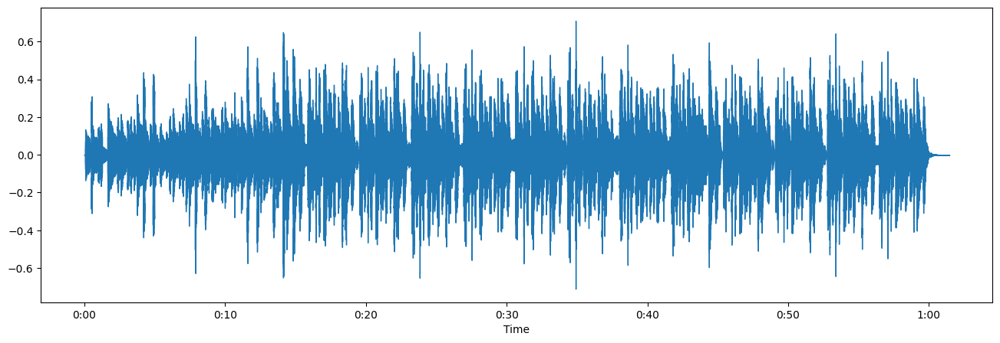

In [78]:
plt.figure(figsize=(16,5))

librosa.display.waveshow(wave_vibeace, sr=sr_vibeace)

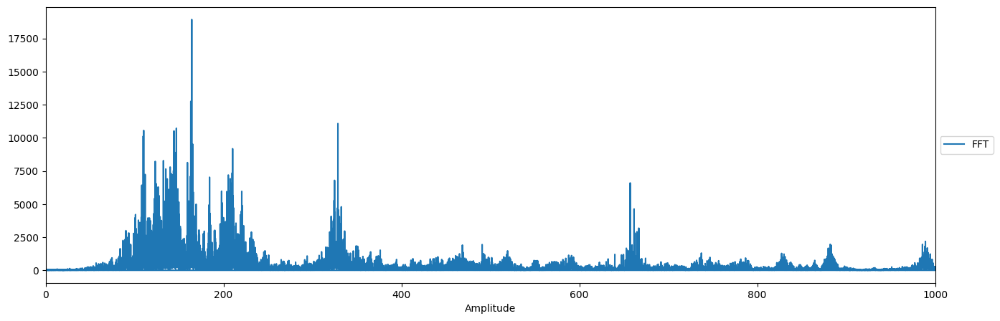

In [79]:
calc_plot_fft(wave_vibeace, sr_vibeace, x_lim=(0,1000), find_peaks=False)

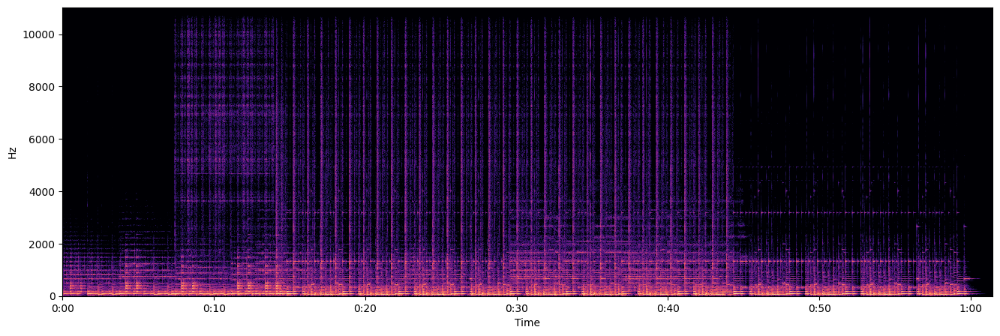

In [81]:
plt.figure(figsize=(16,5))

vibeace_fft = librosa.stft(wave_vibeace)

data = librosa.amplitude_to_db(np.abs(vibeace_fft), ref=np.max)

librosa.display.specshow(data, y_axis="linear", x_axis="time", sr=sr_vibeace)

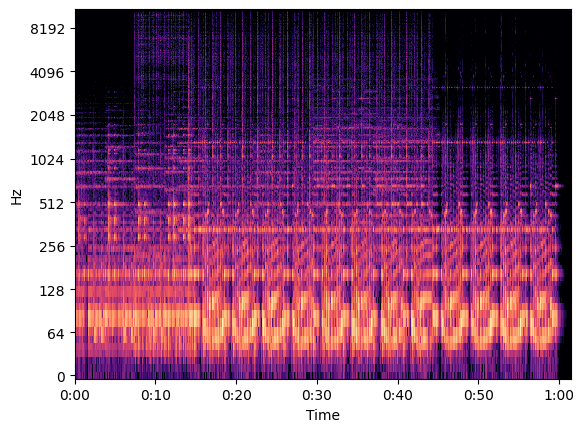

In [82]:
librosa.display.specshow(data, y_axis="log", x_axis="time", sr=sr_vibeace)

# VOLTAMOS AS 20h48

<img src="https://editor.analyticsvidhya.com/uploads/24496wavelet.png" width=550>

<img src="https://editor.analyticsvidhya.com/uploads/64880spectrogram.png" width=550>

In [85]:
import librosa
import librosa.display

import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
import pandas as pd

import random

from IPython.display import Audio

import os

In [131]:
base_path = 'D:/urban_sound/'

In [132]:
for path, subdirs, files in os.walk(base_path):
    print(path)
    print(f"\n No caminho há {len(subdirs)} subpastas e {len(files)} arquivos")
    
    if len(files) < 10:
        print(f"\n Arquivos: {files}")
        
    print()
    print("="*80)
    print()

D:/urban_sound/

 No caminho há 10 subpastas e 1 arquivos

 Arquivos: ['UrbanSound8K.csv']


D:/urban_sound/fold1

 No caminho há 0 subpastas e 873 arquivos


D:/urban_sound/fold10

 No caminho há 0 subpastas e 837 arquivos


D:/urban_sound/fold2

 No caminho há 0 subpastas e 888 arquivos


D:/urban_sound/fold3

 No caminho há 0 subpastas e 925 arquivos


D:/urban_sound/fold4

 No caminho há 0 subpastas e 990 arquivos


D:/urban_sound/fold5

 No caminho há 0 subpastas e 936 arquivos


D:/urban_sound/fold6

 No caminho há 0 subpastas e 823 arquivos


D:/urban_sound/fold7

 No caminho há 0 subpastas e 838 arquivos


D:/urban_sound/fold8

 No caminho há 0 subpastas e 806 arquivos


D:/urban_sound/fold9

 No caminho há 0 subpastas e 816 arquivos




In [133]:
sounds = []

for path, subdirs, files in os.walk(base_path):
    for name in files:
        if ".wav" in name:
            path_audio = path+'/'+name #os.path.join(path, name)
            sounds.append(path_audio)
sounds

['D:/urban_sound/fold1/101415-3-0-2.wav',
 'D:/urban_sound/fold1/101415-3-0-3.wav',
 'D:/urban_sound/fold1/101415-3-0-8.wav',
 'D:/urban_sound/fold1/102106-3-0-0.wav',
 'D:/urban_sound/fold1/102305-6-0-0.wav',
 'D:/urban_sound/fold1/102842-3-0-1.wav',
 'D:/urban_sound/fold1/102842-3-1-0.wav',
 'D:/urban_sound/fold1/102842-3-1-5.wav',
 'D:/urban_sound/fold1/102842-3-1-6.wav',
 'D:/urban_sound/fold1/103074-7-0-0.wav',
 'D:/urban_sound/fold1/103074-7-0-1.wav',
 'D:/urban_sound/fold1/103074-7-0-2.wav',
 'D:/urban_sound/fold1/103074-7-1-0.wav',
 'D:/urban_sound/fold1/103074-7-1-1.wav',
 'D:/urban_sound/fold1/103074-7-1-2.wav',
 'D:/urban_sound/fold1/103074-7-1-3.wav',
 'D:/urban_sound/fold1/103074-7-1-4.wav',
 'D:/urban_sound/fold1/103074-7-1-5.wav',
 'D:/urban_sound/fold1/103074-7-1-6.wav',
 'D:/urban_sound/fold1/103074-7-2-0.wav',
 'D:/urban_sound/fold1/103074-7-3-0.wav',
 'D:/urban_sound/fold1/103074-7-3-1.wav',
 'D:/urban_sound/fold1/103074-7-3-2.wav',
 'D:/urban_sound/fold1/103074-7-3-

In [134]:
len(sounds)

8732

In [135]:
path_audio_aleatorio = random.choice(sounds)
path_audio_aleatorio

'D:/urban_sound/fold1/180937-7-3-27.wav'

In [136]:
Audio(path_audio_aleatorio)

In [137]:
#fsID = Freesound ID
#classID = numero identificador da classe
#occurenceID = Numero identificador para distinguir diferentes ocorrencias do mesmo audio
#sliceID = Numero identificador de diferentes slices pegas da mesma ocorrenicia

In [138]:
num_classe = int(path_audio_aleatorio.split("-")[1])

In [139]:
num_classe

7

In [140]:
dict_class = {0 : "air_conditioner",
              1 : "car_horn",
              2 : "children_playing",
              3 : "dog_bark",
              4 : "drilling",
              5 : "engine_idling",
              6 : "gun_shot",
              7 : "jackhammer",
              8 : "siren",
              9 : "street_music"}

In [141]:
amplitudes_audio, sr = librosa.load(path_audio_aleatorio)

In [142]:
sr

22050

In [143]:
amplitudes_audio.shape

(88200,)

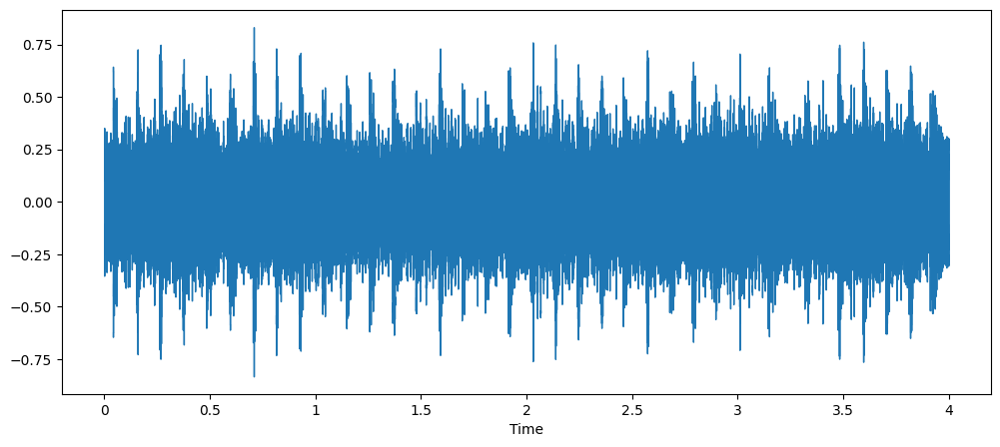

In [144]:
plt.figure(figsize=(12,5))

librosa.display.waveshow(amplitudes_audio, sr=sr)

In [145]:
def choose_random_audio(sounds):
    return random.choice(sounds)

In [146]:
def visualize_listen_urban_sound(sounds):
    path_aleatorio = choose_random_audio(sounds)
    
    nome_sound = path_aleatorio.split("\\")[-1]
    num_classe = int(path_aleatorio.split("-")[1])     
    str_classe = dict_class[num_classe]
    
    print(f"Caminho aleatorio: {path_aleatorio}")
    print(f"No arquivo: {nome_sound} temos o som de: {str_classe}")
    
    amplitudes_audio, sr = librosa.load(path_aleatorio)
    
    plt.figure(figsize=(12,5))
    librosa.display.waveshow(amplitudes_audio, sr=sr)
    plt.show()
    
    return Audio(path_aleatorio)

Caminho aleatorio: D:/urban_sound/fold3/177742-0-0-205.wav
No arquivo: D:/urban_sound/fold3/177742-0-0-205.wav temos o som de: air_conditioner


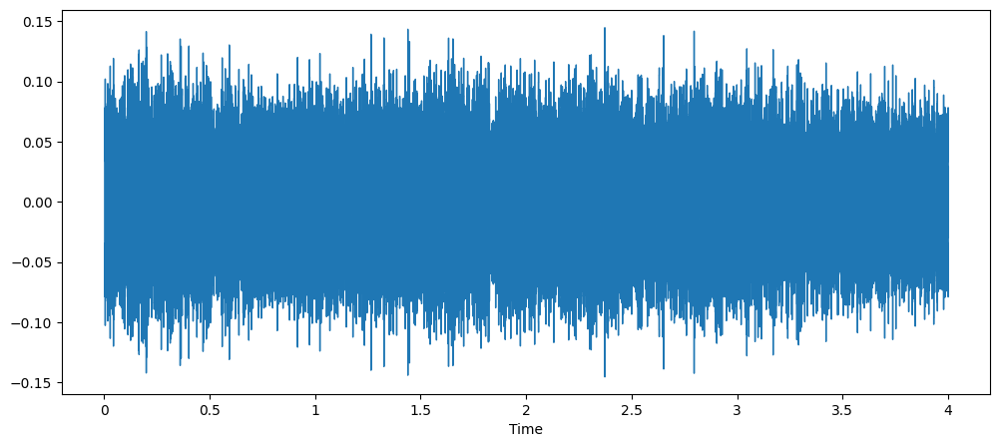

In [147]:
visualize_listen_urban_sound(sounds)

In [148]:
df = pd.read_csv("storage/urban_sound/UrbanSound8k.csv")
df.head()

FileNotFoundError: [Errno 2] No such file or directory: 'storage/urban_sound/UrbanSound8k.csv'

In [149]:
df["class"].value_counts()

dog_bark            1000
children_playing    1000
air_conditioner     1000
street_music        1000
engine_idling       1000
jackhammer          1000
drilling            1000
siren                929
car_horn             429
gun_shot             374
Name: class, dtype: int64

In [150]:
#MFCC (Mel Frequency Cepstral Coefficiets)

In [151]:
file_audio = choose_random_audio(sounds)

amps, sr = librosa.load(file_audio)

Audio(file_audio)

In [152]:
mfcc_40 = librosa.feature.mfcc(y=amps, sr=sr, n_mfcc=40)
mfcc_40.shape

(40, 173)

In [153]:
mfcc_80 = librosa.feature.mfcc(y=amps, sr=sr, n_mfcc=80)
mfcc_80.shape

(80, 173)

In [154]:
mfcc_feat_mean_40 = mfcc_40.mean(axis=1)
mfcc_feat_mean_80 = mfcc_80.mean(axis=1)

In [155]:
mfcc_feat_mean_40.shape

(40,)

In [156]:
mfcc_feat_mean_40

array([-154.85841   ,  111.18967   ,   54.71349   ,   39.12758   ,
        -21.948912  ,   -9.2747965 ,   24.619658  ,   -4.1611667 ,
        -15.135051  ,   23.398495  ,  -24.808666  ,   10.124165  ,
         -8.982304  ,   -0.64930564,    0.8233109 ,   -7.4572897 ,
          4.2744865 ,   -5.711292  ,    2.4938183 ,   -9.518404  ,
          5.991545  ,  -10.0095005 ,    5.8250847 ,   -5.213254  ,
         -6.43776   ,   -5.0447335 ,   -0.8084956 ,   -3.6874566 ,
         -2.378385  ,    6.9351854 ,   -1.7533612 ,    1.1632403 ,
          1.8257201 ,    1.5006875 ,   -3.6506975 ,    6.8834496 ,
         -1.0588198 ,    4.700144  ,    4.46211   ,   -1.9812709 ],
      dtype=float32)

In [158]:
def audio2feature (audio_files_path, n_mfcc=40):
    
    audio, sr = librosa.load(audio_files_path)
    mfcc_feat = librosa.feature.mfcc(y=audio, sr=sr, n_mfcc=n_mfcc)
    mfcc_feat_mean = np.mean(mfcc_feat, axis=1)
    
    return mfcc_feat_mean
    

In [159]:
features_audios = {'features': [],
                  'class': [],
                  'fold': []}

In [160]:
df.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [173]:
df['fold'].isnull().values.any()

False

In [165]:
for index_num, row in df.iterrows():
    path = f"{base_path}fold{row['fold']}/{row['slice_file_name']}"
    features = audio2feature(path, n_mfcc=40)
    
    features_audios["features"].append(features)
    features_audios["class"].append(row['class'])
    features_audios["fold"].append(row['fold'])
    

c:\users\alvzu\appdata\local\programs\python\python37\lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1323
  f"n_fft={n_fft} is too large for input signal of length={y.shape[-1]}"
c:\users\alvzu\appdata\local\programs\python\python37\lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1103
  f"n_fft={n_fft} is too large for input signal of length={y.shape[-1]}"
c:\users\alvzu\appdata\local\programs\python\python37\lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1523
  f"n_fft={n_fft} is too large for input signal of length={y.shape[-1]}"


In [175]:
features_audios['class'] = features_audios['class'][0:8732]
features_audios['features'] = features_audios['features'][0:8732]

In [176]:
features_audios_df = pd.DataFrame(features_audios)

features_audios_df.head()

,features,class,fold
0,"[-211.93698, 62.581203, -122.81315, -60.745293...",dog_bark,5
1,"[-211.93698, 62.581203, -122.81315, -60.745293...",dog_bark,5
2,"[-417.0052, 99.336624, -42.995586, 51.073326, ...",children_playing,5
3,"[-452.39316, 112.36253, -37.578068, 43.195866,...",children_playing,5
4,"[-406.47922, 91.1966, -25.043556, 42.78452, 11...",children_playing,5


In [177]:
features_abertas = pd.DataFrame(features_audios_df['features'].tolist(), columns=[f"X{i+1}" for i in range(40)])
features_abertas

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X31,X32,X33,X34,X35,X36,X37,X38,X39,X40
0,-211.936981,62.581203,-122.813148,-60.745293,-13.893760,-29.789835,-3.978875,11.682742,12.963828,8.336421,...,0.487726,7.510886,-0.885359,2.393814,-6.392372,-2.131859,2.276015,-0.791083,-1.540068,1.321149
1,-211.936981,62.581203,-122.813148,-60.745293,-13.893760,-29.789835,-3.978875,11.682742,12.963828,8.336421,...,0.487726,7.510886,-0.885359,2.393814,-6.392372,-2.131859,2.276015,-0.791083,-1.540068,1.321149
2,-417.005188,99.336624,-42.995586,51.073326,9.853778,7.969693,11.197089,1.929117,7.030397,4.270228,...,-1.250227,2.277220,-1.539243,0.767109,-0.878724,0.908738,-2.681854,1.706798,-1.793606,1.761384
3,-452.393158,112.362534,-37.578068,43.195866,8.631845,15.379366,16.882149,1.233047,6.833122,3.900115,...,0.067258,-0.154539,-5.285954,-0.790016,-2.979211,-0.202845,-3.088082,3.808014,-0.090056,0.869102
4,-406.479218,91.196602,-25.043556,42.784519,11.586844,5.054164,12.431632,-1.599948,6.656064,1.442355,...,-4.996307,1.279155,0.635733,1.414131,-2.831121,1.808179,-2.178431,-0.436479,-3.051344,-0.170013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8727,-354.938995,102.541809,-32.241444,34.098015,2.689894,2.907088,6.716429,-1.194809,-3.017269,-1.755465,...,-2.737668,5.528863,5.087574,2.759572,-3.770879,1.841897,-8.313927,-9.149479,-8.689161,4.712506
8728,-391.372101,125.362389,-40.634056,25.899754,1.730347,5.575200,16.873087,7.889440,3.488613,-4.572376,...,-8.737840,3.033987,3.553834,3.725876,-1.022627,2.604555,-5.585061,-5.811629,-3.813402,5.453191
8729,-339.427155,76.409096,-35.309879,41.984035,-22.963873,-13.623511,27.856026,-9.215820,-5.666291,13.024159,...,4.041202,3.299907,-0.265232,6.929850,3.841744,1.458774,-2.501516,3.609871,-3.208832,-1.789299
8730,-297.315338,102.090263,-36.751080,26.816488,-0.249390,3.960868,11.113069,1.912290,0.677115,-1.804644,...,-7.029234,0.798328,3.187672,7.566283,2.161261,3.160489,-5.056086,-1.622446,1.252144,9.132168


In [179]:
features_audios_df["class fold".split()]

,class,fold
0,dog_bark,5
1,dog_bark,5
2,children_playing,5
3,children_playing,5
4,children_playing,5
...,...,...
8727,car_horn,7
8728,car_horn,7
8729,car_horn,7
8730,car_horn,7


In [180]:
df_final = pd.concat([features_abertas, features_audios_df["class fold".split()]], axis=1)

In [181]:
df_final.head()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X33,X34,X35,X36,X37,X38,X39,X40,class,fold
0,-211.936981,62.581203,-122.813148,-60.745293,-13.893760,-29.789835,-3.978875,11.682742,12.963828,8.336421,...,-0.885359,2.393814,-6.392372,-2.131859,2.276015,-0.791083,-1.540068,1.321149,dog_bark,5
1,-211.936981,62.581203,-122.813148,-60.745293,-13.893760,-29.789835,-3.978875,11.682742,12.963828,8.336421,...,-0.885359,2.393814,-6.392372,-2.131859,2.276015,-0.791083,-1.540068,1.321149,dog_bark,5
2,-417.005188,99.336624,-42.995586,51.073326,9.853778,7.969693,11.197089,1.929117,7.030397,4.270228,...,-1.539243,0.767109,-0.878724,0.908738,-2.681854,1.706798,-1.793606,1.761384,children_playing,5
3,-452.393158,112.362534,-37.578068,43.195866,8.631845,15.379366,16.882149,1.233047,6.833122,3.900115,...,-5.285954,-0.790016,-2.979211,-0.202845,-3.088082,3.808014,-0.090056,0.869102,children_playing,5
4,-406.479218,91.196602,-25.043556,42.784519,11.586844,5.054164,12.431632,-1.599948,6.656064,1.442355,...,0.635733,1.414131,-2.831121,1.808179,-2.178431,-0.436479,-3.051344,-0.170013,children_playing,5


In [183]:
df_final.to_csv("D:/urban_sound/dados_finais.csv")

In [ ]:
#
1) Train test split
2) Normalizar os valores
3) DecisionTree